# Homework 4 - Multiple Forces and torques

## Part 1: a single module with three motors 

<div>
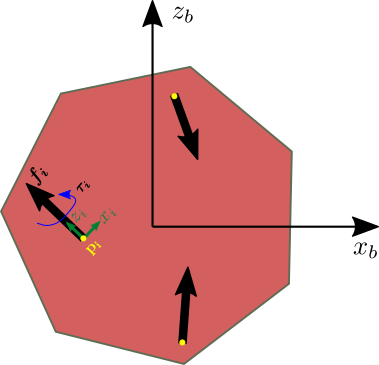
</div>

We ilustrate in the figure a single module. Where, $\boldsymbol{z}i = {}^B \boldsymbol{R}_i \boldsymbol{e}_3$ and $\boldsymbol{e}_3 = [ 0 \, 0 \, 1]^T$.

$
\begin{eqnarray}
        \boldsymbol{f}_i &=& f_i \, \boldsymbol{z}_i, \, \\
        \boldsymbol{\tau}_i &=& \left (\boldsymbol{p}_i \times \boldsymbol{z}_i + \frac{k_f}{k_m} \boldsymbol{z}_i \right) f_i
\end{eqnarray}
$




Total wrench

$
\begin{eqnarray}
        \boldsymbol{f}_T &=& \sum_i \boldsymbol{f}_i\\
        \boldsymbol{\tau}_T &=& \sum_i \boldsymbol{\tau}_i
\end{eqnarray}
$



From Newton,

$m \boldsymbol{\ddot{p}}  = \boldsymbol{f}_T - mg\boldsymbol{e}_3  $

From Euler equations:

$m \boldsymbol{\tau}_T  =  J \boldsymbol{\dot{\omega}} + J \boldsymbol{\omega} \times \boldsymbol{\omega} \$

Using the wrenches replesentation

$
\begin{eqnarray}
\left [ \begin{array}{c}
            \boldsymbol{f}_T\\
            \boldsymbol{\tau}_T
        \end{array} \right ]
        &=&     
\left [ \begin{array}{cc}
            m \, I & 0\\
            0 & J
        \end{array} \right ]
\left [ \begin{array}{c}
            \boldsymbol{\ddot{p}}\\
            \boldsymbol{\dot{\omega}}
        \end{array} \right ]    
        +
\left [ \begin{array}{c}
            -mg \boldsymbol{e}_3\\
            J \boldsymbol{\omega} \times \boldsymbol{\omega}
        \end{array} \right ]        
\end{eqnarray}
$


Solving for the acceleration

$
\begin{eqnarray}
\left [ \begin{array}{c}
            \boldsymbol{\ddot{p}}\\
            \boldsymbol{\dot{\omega}}
        \end{array} \right ] 
        &=&
\left [ \begin{array}{cc}
            m \, I & 0\\
            0 & J
        \end{array} \right ]^{-1} 
\left (        
\left [ \begin{array}{c}
            \boldsymbol{f}_T\\
            \boldsymbol{\tau}_T
        \end{array} \right ]
        +
\left [ \begin{array}{c}
            -mg \boldsymbol{e}_3\\
            J \boldsymbol{\omega} \times \boldsymbol{\omega}
        \end{array} \right ] \right ) \\
        &=& \boldsymbol{M}^{-1}(\boldsymbol{A} \boldsymbol{u}+\boldsymbol{b})
\end{eqnarray}
$


In [22]:
%pylab inline

import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

from numpy.linalg import pinv

import matplotlib.pyplot as plt
# from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

import matplotlib.patches as patches
    
# import matplotlib
# matplotlib.rcParams['animation.embed_limit'] = 2**128
matplotlib.rcParams.update({'font.size': 10})
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

def Rotz(Θ):
    R = array([[cos(Θ), -sin(Θ),0], [sin(Θ), cos(Θ),0],[0,0,1]])
    return R

def Roty(Θ):
    R = array([[cos(Θ), sin(Θ)], [-sin(Θ), cos(Θ)]])
    return R


def plotsim(x_log, xd_log):
    x_log = array(x_log)
    xd_log = array(xd_log)

    
    plt.figure(figsize=(10,5))
    plot(x_log[:,0], x_log[:,1])
    plot(xd_log[:,0], xd_log[:,1],'--r')
    xlabel('x')
    ylabel('z')
    plt.tight_layout()
    fig = plt.figure(figsize=(10,5))
    subplot(3,3,1)
    plot(time[:],x_log[:-1,0])
    plot(time[:],xd_log[:-1,0],'--r')
    xlabel('t')
    ylabel('x')  
    subplot(3,3,2)
    plot(time[:],x_log[:-1,1])
    plot(time[:],xd_log[:-1,1],'--r')
    xlabel('t')
    ylabel('z')
    subplot(3,3,3)
    plot(time[:],x_log[:-1,2])
    plot(time[:],xd_log[:-1,2],'--r')
    xlabel('t')
    ylabel('phi')    
    plt.show()
    
def plotsim2(x_log):
    x_log = array(x_log)
#     F_log = array(F_log)
#     print(len(x_log[:,0]))
    # subplot(2,1,1)
#     plt.figure(figsize=(10,5))
#     plot(x_log[:,0], x_log[:,1])
#     xlabel('x')
#     ylabel('z')
#     plt.tight_layout()
    fig = plt.figure(figsize=(10,5))
    subplot(3,3,1)
    plot(time[:],x_log[:-1,0])
    xlabel('t')
    ylabel('x')
    subplot(3,3,2)
    plot(time[:],x_log[:-1,1])
    xlabel('t')
    ylabel('z')
    subplot(3,3,3)
    plot(time[:],x_log[:-1,2])
    xlabel('t')
    ylabel('phi')
    subplot(3,3,4)
    plot(time[:],x_log[:-1,3])
    xlabel('t')
    ylabel('dx') 
    subplot(3,3,5)
    plot(time[:],x_log[:-1,4])
    xlabel('t')
    ylabel('dz') 
    subplot(3,3,6)
    plot(time[:],x_log[:-1,5])
    xlabel('t')
    ylabel('dphi') 
    plt.tight_layout()
    plt.show()    

Populating the interactive namespace from numpy and matplotlib


/home/swarm/.local/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['time']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


[[[ 8.09016994e-01 -1.00000000e+00  7.07106781e-01]
  [ 5.87785252e-01 -1.22464680e-16 -7.07106781e-01]]

 [[-5.87785252e-01  1.22464680e-16  7.07106781e-01]
  [ 8.09016994e-01 -1.00000000e+00  7.07106781e-01]]]
[[ 8.09016994e-01 -1.00000000e+00  7.07106781e-01]
 [ 5.87785252e-01 -1.22464680e-16 -7.07106781e-01]
 [ 4.04508497e-01  3.00000000e-01  8.48528137e-01]]
Rank is: 3


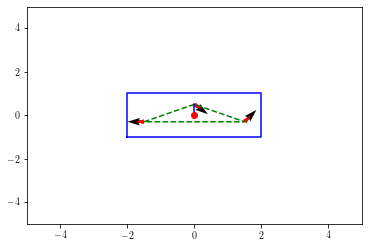

In [23]:
RotY = lambda θ: [[cos(θ), 0, sin(θ)], 
         [0, 1, 0],
         [-sin(θ), 0, cos(θ)]]
def vehicle_se2(x, z, θ, D, u=[0,0,0], ax=plt.axes()): 
#     ax.clear()
    ax.set_xlim([-5,5])
    ax.set_ylim([-5,5])
    # Design
    pxs = list(D[:,0])
    pzs = list(D[:,1])    
    αs  = copy(D[:,2])
    # Rotate
    R = RotY(θ)
    points = D[:,:2]
    points = array([np.dot(R, [px,0,pz]) for px,pz in points])
    pxs = points[:,0]
    pzs = points[:,2]
    
    
    D2 = array([(-2,-1,0), (-2,1,0), (2, 1,0), (2, -1,0)])
    pxs2 = list(D2[:,0])
    pzs2 = list(D2[:,1])
    # Rotate
    points2 = D2[:,:2]
    points2 = array([np.dot(R, [px2,0,pz2]) for px2,pz2 in points2])
    pxs2 = points2[:,0]
    pzs2 = points2[:,2]
    
    αs += θ
    # Translate
    pxs += x
    pzs += z
    pxs2 += x
    pzs2 += z
    # propellers
    e1 = [1,0,0]    
    prop_x = array([np.dot(RotY(α), e1)[0] for α in αs])
    prop_z = array([np.dot(RotY(α), e1)[2] for α in αs])
    # Plot propellers
    ax.quiver(pxs, pzs, prop_x, prop_z, scale=20)
    # control input    
    ax.quiver(pxs, pzs, u*prop_x, u*prop_z, scale=40, color='r')
    # Plot Frame           
    ax.plot(list(pxs) + [pxs[0]], list(pzs) + [pzs[0]],'--g')
    ax.plot(list(pxs2) + [pxs2[0]], list(pzs2) + [pzs2[0]],'b')
    ax.plot([x, pxs[0]], [z, pzs[0]],'b')    
    ax.plot(x,z, 'ro')  # Center of mass
#     ax.hold(True)
    

D1 = array([(0,0.5,pi/5), (-1.5,-0.3,-pi), (1.5, -0.3, -pi/4)])
x, z, θ = 0., 0., 0
u = 1, 1, 1 
vehicle_se2(x, z, θ, D1, u)


# D2 = array([(-0,0.5,pi/2), (-1.5,-0.3, -3*pi/4), (1.5, -0.3, 0)])
# x, z, θ = 2., 0., 0
# u = 0,0,0
# vehicle_se2(x, z, θ, D2, u)

# D = np.vstack((D1,D2))
D=D1

αs = copy(D[:,2])
co = cos(αs)
si = sin(αs)

#points


pxs = list(D[:,0])
pzs = list(D[:,1])



zi = (Roty(list(αs[:])))
print(zi)


A = array([co, si, [pzs[0]*co[0]-pxs[0]*si[0], pzs[1]*co[1]-pxs[1]*si[1], pzs[2]*co[2]-pxs[2]*si[2]]])


print(A)
print('Rank is:', np.linalg.matrix_rank(A))



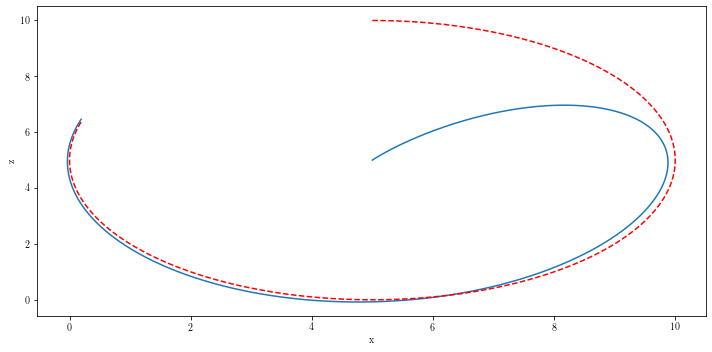

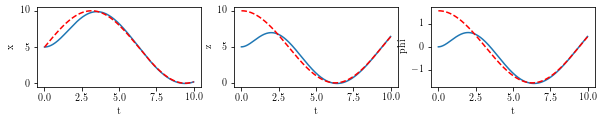

In [62]:
def trajectory(t):
#     xd = array([1,2,0.5*sin(t/2), 
#                 0,0,0.5*cos(t/2)/2])
    xd = array([5 + 5*sin(t/2), 5 + 5*cos(t/2), pi/2*cos(t/2), 
                5*cos(t/2)/2, -5*sin(t/2)/2    , -pi/2*sin(t/2)/2,
               -5*sin(t/2)/4, -5*cos(t/2)/4    , -pi/2*cos(t/2)/4])
    return xd

def control(x,xd,t):

       
    epos = array(xd[0:3] - x[0:3])
    evel = xd[3:6] - x[3:6]
     
    u = kp*epos.T + kp*evel.T + xd[6:9]
    
#     print(u)
    
    return u

def simulate(x,u,t):
    
    #desired wrench
    w = A.dot(u)
    
    Baux = np.hstack((Roty(x[2])/m,array([[0],[-g]])))
    Baux = np.vstack((Baux,array([0,0,Iyy])))    
    
    B = Baux.dot(A)
   
    uT = inv(B).dot(u + array([0,-g, 0]))
    
    a = B.dot(uT) - array([0,-g, 0])
    
    dx = concatenate((x[3:6], a[0:3]), axis=None)  
    
    x += dx * Δt
    
    return [x]



tf = 10.
Δt = 0.01    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval
g = 9.8
ℓ = 1.
d = 1

τ = -ℓ
Iyy = 1
m=1
kp = array([1,1,1])#array([1.5,1.5,2.])
kd = array([0.1,0.1,0.1])#array([0.5,0.5,0.5])

xd = zeros((1,6))

dx_0 = array([0., 0., 0.01])
x_0 = array([5., 5., 0.])

x = concatenate((x_0, dx_0/m), axis=None)
xd = trajectory(0)
u = array([0., 0., 0.])

x_log = [copy(x)]
xd_log = [copy(xd)]
u_log = [copy(u)]


for t in time:
    xd = trajectory(t)
    u = control(x,xd,t)
    [x] = simulate(x,u,t)
    
    x_log.append(copy(x))
    xd_log.append(copy(xd))
    u_log.append(copy(u))
    
# sol = odeint(simulate, x, t, args=(m, ℓ, ))    


plotsim(x_log,xd_log)


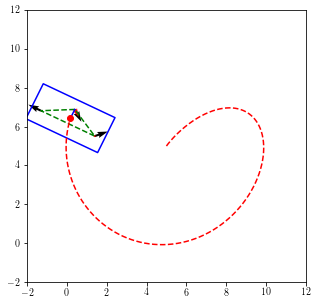

In [63]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML


fig, ax = plt.subplots(figsize=(5, 5))
x_log = array(x_log) 
u_log = array(u_log) 
    
def animate(t):
    ax.clear()
    ax.set_xlim([-2,12])
    ax.set_ylim([-2,12])
    
    # Path
    x, z, θ = x_log[t,0], x_log[t,1], x_log[t,2]
    u = u_log[t]
    

    # Design
    pxs = list(D[:,0])
    pzs = list(D[:,1])    
    αs  = copy(D[:,2])
    # Rotate
    R = RotY(θ)
    points = D[:,:2]
    points = array([np.dot(R, [px,0,pz]) for px,pz in points])
    pxs = points[:,0]
    pzs = points[:,2]
    
    
    D2 = array([(-2,-1,0), (-2,1,0), (2, 1,0), (2, -1,0)])
    pxs2 = list(D2[:,0])
    pzs2 = list(D2[:,1])
    # Rotate
    points2 = D2[:,:2]
    points2 = array([np.dot(R, [px2,0,pz2]) for px2,pz2 in points2])
    pxs2 = points2[:,0]
    pzs2 = points2[:,2]
    
    αs += θ
    # Translate
    pxs += x
    pzs += z
    pxs2 += x
    pzs2 += z
    # propellers
    e1 = [1,0,0]    
    prop_x = array([np.dot(RotY(α), e1)[0] for α in αs])
    prop_z = array([np.dot(RotY(α), e1)[2] for α in αs])
    # Plot propellers
    ax.quiver(pxs, pzs, prop_x, prop_z, scale=20)
    # control input    
    ax.quiver(pxs, pzs, u*prop_x, u*prop_z, scale=40, color='r')
    # Plot Frame           
    ax.plot(list(pxs) + [pxs[0]], list(pzs) + [pzs[0]],'--g')
    ax.plot(list(pxs2) + [pxs2[0]], list(pzs2) + [pzs2[0]],'b')
    ax.plot([x, pxs[0]], [z, pzs[0]],'b')    
    ax.plot(x,z, 'ro')  # Center of mass
    
    
    plot(x_log[:,0], x_log[:,1], '--r')
    
    

anim = matplotlib.animation.FuncAnimation(fig, animate, frames=len(time), interval=20)

# HTML(anim.to_jshtml())
display(HTML(anim.to_jshtml()))